# Imports necessary Libraries and Conventions

In [1]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from keras_preprocessing.sequence import pad_sequences
from keras.preprocessing.text import Tokenizer    # tokenizer
from keras.models import Sequential, Model
from keras.layers import Embedding
from keras.layers import Input, Activation,Dense, Permute, Dropout, add, dot, concatenate, LSTM
from IPython.display import Image
# from tensorflow.keras.preprocessing.sequence import pad_sequences
# from keras.utils.data_utils import pad_sequences


In [3]:
# open the train dataset using pickle
with open("DataSet/train_qa.txt", "rb") as fp:
    train_data = pickle.load(fp)

In [4]:
train_data

[(['Mary',
   'moved',
   'to',
   'the',
   'bathroom',
   '.',
   'Sandra',
   'journeyed',
   'to',
   'the',
   'bedroom',
   '.'],
  ['Is', 'Sandra', 'in', 'the', 'hallway', '?'],
  'no'),
 (['Mary',
   'moved',
   'to',
   'the',
   'bathroom',
   '.',
   'Sandra',
   'journeyed',
   'to',
   'the',
   'bedroom',
   '.',
   'Mary',
   'went',
   'back',
   'to',
   'the',
   'bedroom',
   '.',
   'Daniel',
   'went',
   'back',
   'to',
   'the',
   'hallway',
   '.'],
  ['Is', 'Daniel', 'in', 'the', 'bathroom', '?'],
  'no'),
 (['Mary',
   'moved',
   'to',
   'the',
   'bathroom',
   '.',
   'Sandra',
   'journeyed',
   'to',
   'the',
   'bedroom',
   '.',
   'Mary',
   'went',
   'back',
   'to',
   'the',
   'bedroom',
   '.',
   'Daniel',
   'went',
   'back',
   'to',
   'the',
   'hallway',
   '.',
   'Sandra',
   'went',
   'to',
   'the',
   'kitchen',
   '.',
   'Daniel',
   'went',
   'back',
   'to',
   'the',
   'bathroom',
   '.'],
  ['Is', 'Daniel', 'in', 'the', '

In [5]:
# open the test dataset using pickle
with open("DataSet/test_qa.txt", "rb") as fp:
    test_data = pickle.load(fp)

In [6]:
test_data

[(['Mary',
   'got',
   'the',
   'milk',
   'there',
   '.',
   'John',
   'moved',
   'to',
   'the',
   'bedroom',
   '.'],
  ['Is', 'John', 'in', 'the', 'kitchen', '?'],
  'no'),
 (['Mary',
   'got',
   'the',
   'milk',
   'there',
   '.',
   'John',
   'moved',
   'to',
   'the',
   'bedroom',
   '.',
   'Mary',
   'discarded',
   'the',
   'milk',
   '.',
   'John',
   'went',
   'to',
   'the',
   'garden',
   '.'],
  ['Is', 'John', 'in', 'the', 'kitchen', '?'],
  'no'),
 (['Mary',
   'got',
   'the',
   'milk',
   'there',
   '.',
   'John',
   'moved',
   'to',
   'the',
   'bedroom',
   '.',
   'Mary',
   'discarded',
   'the',
   'milk',
   '.',
   'John',
   'went',
   'to',
   'the',
   'garden',
   '.',
   'Daniel',
   'moved',
   'to',
   'the',
   'bedroom',
   '.',
   'Daniel',
   'went',
   'to',
   'the',
   'garden',
   '.'],
  ['Is', 'John', 'in', 'the', 'garden', '?'],
  'yes'),
 (['Mary',
   'got',
   'the',
   'milk',
   'there',
   '.',
   'John',
   'moved',


In [7]:
type(test_data)

list

In [8]:
len(test_data)   # 1,000 for test

1000

In [9]:
len(train_data) # 10,000 for train

10000

In [10]:
train_data[0]

(['Mary',
  'moved',
  'to',
  'the',
  'bathroom',
  '.',
  'Sandra',
  'journeyed',
  'to',
  'the',
  'bedroom',
  '.'],
 ['Is', 'Sandra', 'in', 'the', 'hallway', '?'],
 'no')

In [11]:
' '.join(train_data[0][0])  # our story line

'Mary moved to the bathroom . Sandra journeyed to the bedroom .'

In [12]:
' '.join(train_data[0][1])  # our question line

'Is Sandra in the hallway ?'

In [13]:
train_data[0][2]    # answer

'no'

In [14]:
# setting vocabulary
vocab = set() # an empty set

In [15]:
all_data = test_data + train_data

In [16]:
all_data

[(['Mary',
   'got',
   'the',
   'milk',
   'there',
   '.',
   'John',
   'moved',
   'to',
   'the',
   'bedroom',
   '.'],
  ['Is', 'John', 'in', 'the', 'kitchen', '?'],
  'no'),
 (['Mary',
   'got',
   'the',
   'milk',
   'there',
   '.',
   'John',
   'moved',
   'to',
   'the',
   'bedroom',
   '.',
   'Mary',
   'discarded',
   'the',
   'milk',
   '.',
   'John',
   'went',
   'to',
   'the',
   'garden',
   '.'],
  ['Is', 'John', 'in', 'the', 'kitchen', '?'],
  'no'),
 (['Mary',
   'got',
   'the',
   'milk',
   'there',
   '.',
   'John',
   'moved',
   'to',
   'the',
   'bedroom',
   '.',
   'Mary',
   'discarded',
   'the',
   'milk',
   '.',
   'John',
   'went',
   'to',
   'the',
   'garden',
   '.',
   'Daniel',
   'moved',
   'to',
   'the',
   'bedroom',
   '.',
   'Daniel',
   'went',
   'to',
   'the',
   'garden',
   '.'],
  ['Is', 'John', 'in', 'the', 'garden', '?'],
  'yes'),
 (['Mary',
   'got',
   'the',
   'milk',
   'there',
   '.',
   'John',
   'moved',


In [17]:
type(all_data)

list

In [18]:
for data in all_data:
    print(data)
    print("\n")

(['Mary', 'got', 'the', 'milk', 'there', '.', 'John', 'moved', 'to', 'the', 'bedroom', '.'], ['Is', 'John', 'in', 'the', 'kitchen', '?'], 'no')


(['Mary', 'got', 'the', 'milk', 'there', '.', 'John', 'moved', 'to', 'the', 'bedroom', '.', 'Mary', 'discarded', 'the', 'milk', '.', 'John', 'went', 'to', 'the', 'garden', '.'], ['Is', 'John', 'in', 'the', 'kitchen', '?'], 'no')


(['Mary', 'got', 'the', 'milk', 'there', '.', 'John', 'moved', 'to', 'the', 'bedroom', '.', 'Mary', 'discarded', 'the', 'milk', '.', 'John', 'went', 'to', 'the', 'garden', '.', 'Daniel', 'moved', 'to', 'the', 'bedroom', '.', 'Daniel', 'went', 'to', 'the', 'garden', '.'], ['Is', 'John', 'in', 'the', 'garden', '?'], 'yes')


(['Mary', 'got', 'the', 'milk', 'there', '.', 'John', 'moved', 'to', 'the', 'bedroom', '.', 'Mary', 'discarded', 'the', 'milk', '.', 'John', 'went', 'to', 'the', 'garden', '.', 'Daniel', 'moved', 'to', 'the', 'bedroom', '.', 'Daniel', 'went', 'to', 'the', 'garden', '.', 'Daniel', 'travelled', 'to'

In [19]:
# consider a vocab for storing the all non repeated word from the datasets
for story, question, answer in all_data:
    vocab = vocab.union(set(story))
    vocab = vocab.union(set(question))

In [20]:
# add the yes and no to the vocab since the vocab contains only the story and query
vocab.add('yes')
vocab.add('no')

In [21]:
vocab # no word will be repeated in a set

{'.',
 '?',
 'Daniel',
 'Is',
 'John',
 'Mary',
 'Sandra',
 'apple',
 'back',
 'bathroom',
 'bedroom',
 'discarded',
 'down',
 'dropped',
 'football',
 'garden',
 'got',
 'grabbed',
 'hallway',
 'in',
 'journeyed',
 'kitchen',
 'left',
 'milk',
 'moved',
 'no',
 'office',
 'picked',
 'put',
 'the',
 'there',
 'to',
 'took',
 'travelled',
 'up',
 'went',
 'yes'}

In [22]:
len(vocab)

37

In [23]:
vocab_len = len(vocab) + 1 # extra space to hold 0 for the keras pair sequence
vocab_len

38

In [24]:
all_data

[(['Mary',
   'got',
   'the',
   'milk',
   'there',
   '.',
   'John',
   'moved',
   'to',
   'the',
   'bedroom',
   '.'],
  ['Is', 'John', 'in', 'the', 'kitchen', '?'],
  'no'),
 (['Mary',
   'got',
   'the',
   'milk',
   'there',
   '.',
   'John',
   'moved',
   'to',
   'the',
   'bedroom',
   '.',
   'Mary',
   'discarded',
   'the',
   'milk',
   '.',
   'John',
   'went',
   'to',
   'the',
   'garden',
   '.'],
  ['Is', 'John', 'in', 'the', 'kitchen', '?'],
  'no'),
 (['Mary',
   'got',
   'the',
   'milk',
   'there',
   '.',
   'John',
   'moved',
   'to',
   'the',
   'bedroom',
   '.',
   'Mary',
   'discarded',
   'the',
   'milk',
   '.',
   'John',
   'went',
   'to',
   'the',
   'garden',
   '.',
   'Daniel',
   'moved',
   'to',
   'the',
   'bedroom',
   '.',
   'Daniel',
   'went',
   'to',
   'the',
   'garden',
   '.'],
  ['Is', 'John', 'in', 'the', 'garden', '?'],
  'yes'),
 (['Mary',
   'got',
   'the',
   'milk',
   'there',
   '.',
   'John',
   'moved',


In [25]:
for data in all_data:
    print(len(data[0]))   # shows the length of the each story

12
23
35
47
59
13
26
37
50
62
12
24
37
49
60
12
25
38
50
62
12
24
36
47
59
12
25
36
48
59
12
26
39
51
63
13
24
37
50
62
13
26
38
50
63
13
25
36
49
61
13
26
39
51
64
13
25
37
50
62
13
25
37
50
61
12
25
38
50
62
12
25
37
50
61
12
25
36
48
60
12
24
36
48
60
13
25
37
49
60
13
25
39
51
64
12
25
37
49
61
12
25
38
50
61
12
24
36
49
62
13
25
37
50
62
12
23
35
47
59
12
25
37
48
73
12
24
37
49
61
12
24
37
49
62
14
26
37
49
62
12
23
35
48
59
12
24
36
49
61
13
25
37
49
61
12
25
37
50
62
12
24
36
47
58
12
24
36
48
61
25
38
50
62
74
13
25
37
49
62
12
24
37
49
62
12
24
36
48
60
12
24
36
48
61
12
25
36
50
62
24
36
49
61
74
12
24
36
47
59
13
25
38
50
62
12
25
37
49
61
12
24
36
48
61
13
25
37
48
61
13
26
39
52
63
13
27
40
51
63
12
24
36
48
59
12
24
36
47
58
12
23
35
47
59
12
25
38
50
62
12
24
35
47
60
13
26
38
51
63
12
24
36
48
61
12
24
36
48
60
13
25
38
49
62
12
24
35
47
59
12
24
36
48
58
12
24
36
48
61
13
26
38
50
63
24
37
49
62
74
12
24
36
49
61
13
26
39
51
63
12
24
36
48
60
12
24
36
47
59
13
26
38
5

In [26]:
max([len(data[0]) for data in all_data])

156

In [27]:
max_story_len = max([len(data[0]) for data in all_data])
max_story_len

156

In [28]:
max_question_len = max([len(data[1]) for data in all_data])
max_question_len

6

In [29]:
max_answer_len = max([len(data[2]) for data in all_data])
max_answer_len

3

In [30]:
# Vectorize data means convert the data into numerical form
# convert to numerical form vectorize use keras

In [96]:
from keras_preprocessing.sequence import pad_sequences
# from keras.utils.data_utils import pad_sequences
from keras.preprocessing.text import Tokenizer    # tokenizer
# from tensorflow.keras.preprocessing.sequence import pad_sequences
# tokenizer divides the given data into tokens and assigns a specific value for each tokens

In [32]:
tokenizer = Tokenizer(filters = [])

In [33]:
tokenizer.fit_on_texts(vocab)

In [34]:
tokenizer.word_index    # Id's were given to each word

{'no': 1,
 'there': 2,
 '.': 3,
 'bathroom': 4,
 'left': 5,
 'the': 6,
 'to': 7,
 'mary': 8,
 'dropped': 9,
 'up': 10,
 'got': 11,
 'apple': 12,
 'grabbed': 13,
 'milk': 14,
 'office': 15,
 'john': 16,
 'moved': 17,
 'journeyed': 18,
 'football': 19,
 'took': 20,
 'hallway': 21,
 '?': 22,
 'sandra': 23,
 'kitchen': 24,
 'in': 25,
 'back': 26,
 'went': 27,
 'bedroom': 28,
 'discarded': 29,
 'garden': 30,
 'is': 31,
 'daniel': 32,
 'down': 33,
 'picked': 34,
 'yes': 35,
 'travelled': 36,
 'put': 37}

In [35]:
train_story_text = []
train_question_text = []
train_answers = []
# appending the story and question to the empty train lists
for story, question, answer in train_data:
    train_story_text.append(story)
    train_question_text.append(question)

In [36]:
train_story_seq = tokenizer.texts_to_sequences(train_story_text)
train_story_seq
# output the text into form of sequence of tokens using tokenizer

[[8, 17, 7, 6, 4, 3, 23, 18, 7, 6, 28, 3],
 [8,
  17,
  7,
  6,
  4,
  3,
  23,
  18,
  7,
  6,
  28,
  3,
  8,
  27,
  26,
  7,
  6,
  28,
  3,
  32,
  27,
  26,
  7,
  6,
  21,
  3],
 [8,
  17,
  7,
  6,
  4,
  3,
  23,
  18,
  7,
  6,
  28,
  3,
  8,
  27,
  26,
  7,
  6,
  28,
  3,
  32,
  27,
  26,
  7,
  6,
  21,
  3,
  23,
  27,
  7,
  6,
  24,
  3,
  32,
  27,
  26,
  7,
  6,
  4,
  3],
 [8,
  17,
  7,
  6,
  4,
  3,
  23,
  18,
  7,
  6,
  28,
  3,
  8,
  27,
  26,
  7,
  6,
  28,
  3,
  32,
  27,
  26,
  7,
  6,
  21,
  3,
  23,
  27,
  7,
  6,
  24,
  3,
  32,
  27,
  26,
  7,
  6,
  4,
  3,
  32,
  34,
  10,
  6,
  19,
  2,
  3,
  32,
  27,
  7,
  6,
  28,
  3],
 [8,
  17,
  7,
  6,
  4,
  3,
  23,
  18,
  7,
  6,
  28,
  3,
  8,
  27,
  26,
  7,
  6,
  28,
  3,
  32,
  27,
  26,
  7,
  6,
  21,
  3,
  23,
  27,
  7,
  6,
  24,
  3,
  32,
  27,
  26,
  7,
  6,
  4,
  3,
  32,
  34,
  10,
  6,
  19,
  2,
  3,
  32,
  27,
  7,
  6,
  28,
  3,
  16,
  36,
  7,
  6,
  15,
  3,


In [37]:
len(train_story_text)

10000

In [38]:
len(train_story_seq)

10000

In [39]:
train_story_seq

[[8, 17, 7, 6, 4, 3, 23, 18, 7, 6, 28, 3],
 [8,
  17,
  7,
  6,
  4,
  3,
  23,
  18,
  7,
  6,
  28,
  3,
  8,
  27,
  26,
  7,
  6,
  28,
  3,
  32,
  27,
  26,
  7,
  6,
  21,
  3],
 [8,
  17,
  7,
  6,
  4,
  3,
  23,
  18,
  7,
  6,
  28,
  3,
  8,
  27,
  26,
  7,
  6,
  28,
  3,
  32,
  27,
  26,
  7,
  6,
  21,
  3,
  23,
  27,
  7,
  6,
  24,
  3,
  32,
  27,
  26,
  7,
  6,
  4,
  3],
 [8,
  17,
  7,
  6,
  4,
  3,
  23,
  18,
  7,
  6,
  28,
  3,
  8,
  27,
  26,
  7,
  6,
  28,
  3,
  32,
  27,
  26,
  7,
  6,
  21,
  3,
  23,
  27,
  7,
  6,
  24,
  3,
  32,
  27,
  26,
  7,
  6,
  4,
  3,
  32,
  34,
  10,
  6,
  19,
  2,
  3,
  32,
  27,
  7,
  6,
  28,
  3],
 [8,
  17,
  7,
  6,
  4,
  3,
  23,
  18,
  7,
  6,
  28,
  3,
  8,
  27,
  26,
  7,
  6,
  28,
  3,
  32,
  27,
  26,
  7,
  6,
  21,
  3,
  23,
  27,
  7,
  6,
  24,
  3,
  32,
  27,
  26,
  7,
  6,
  4,
  3,
  32,
  34,
  10,
  6,
  19,
  2,
  3,
  32,
  27,
  7,
  6,
  28,
  3,
  16,
  36,
  7,
  6,
  15,
  3,


In [40]:
train_story_text

[['Mary',
  'moved',
  'to',
  'the',
  'bathroom',
  '.',
  'Sandra',
  'journeyed',
  'to',
  'the',
  'bedroom',
  '.'],
 ['Mary',
  'moved',
  'to',
  'the',
  'bathroom',
  '.',
  'Sandra',
  'journeyed',
  'to',
  'the',
  'bedroom',
  '.',
  'Mary',
  'went',
  'back',
  'to',
  'the',
  'bedroom',
  '.',
  'Daniel',
  'went',
  'back',
  'to',
  'the',
  'hallway',
  '.'],
 ['Mary',
  'moved',
  'to',
  'the',
  'bathroom',
  '.',
  'Sandra',
  'journeyed',
  'to',
  'the',
  'bedroom',
  '.',
  'Mary',
  'went',
  'back',
  'to',
  'the',
  'bedroom',
  '.',
  'Daniel',
  'went',
  'back',
  'to',
  'the',
  'hallway',
  '.',
  'Sandra',
  'went',
  'to',
  'the',
  'kitchen',
  '.',
  'Daniel',
  'went',
  'back',
  'to',
  'the',
  'bathroom',
  '.'],
 ['Mary',
  'moved',
  'to',
  'the',
  'bathroom',
  '.',
  'Sandra',
  'journeyed',
  'to',
  'the',
  'bedroom',
  '.',
  'Mary',
  'went',
  'back',
  'to',
  'the',
  'bedroom',
  '.',
  'Daniel',
  'went',
  'back',
  'to

In [41]:
# Separating story, query and answer

def vectorize_stories(data, word_index = tokenizer.word_index, max_story_len = max_story_len, max_question_len = max_question_len):

    X = [] # story
    Xq = [] # query/question
    Y = [] # correct answer

    for story, query, answer in data:
        x = [word_index[word.lower()] for word in story]     # storing the each word from story as word_index taken from tokenizer
        xq = [word_index[word.lower()] for word in query]    # storing the each word from query as word_index taken from tokenizer
        y = np.zeros(len(word_index) + 1)
        
        y[word_index[answer]] = 1

        X.append(x)
        Xq.append(xq)
        Y.append(y)
    return(pad_sequences(X, maxlen = max_story_len), pad_sequences(Xq, maxlen = max_question_len), np.array(Y) )
# pad_sequence ensures that all sequence in the list have same length

In [42]:
inputs_train, queries_train, answers_train = vectorize_stories(train_data)

In [43]:
inputs_test, queries_test, answers_test = vectorize_stories(test_data)

In [44]:
inputs_train

array([[ 0,  0,  0, ...,  6, 28,  3],
       [ 0,  0,  0, ...,  6, 21,  3],
       [ 0,  0,  0, ...,  6,  4,  3],
       ...,
       [ 0,  0,  0, ...,  6, 28,  3],
       [ 0,  0,  0, ..., 14,  2,  3],
       [ 0,  0,  0, ..., 12,  2,  3]])

In [45]:
queries_test

array([[31, 16, 25,  6, 24, 22],
       [31, 16, 25,  6, 24, 22],
       [31, 16, 25,  6, 30, 22],
       ...,
       [31,  8, 25,  6, 28, 22],
       [31, 23, 25,  6, 30, 22],
       [31,  8, 25,  6, 30, 22]])

In [46]:
answers_test

array([[0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.]])

In [47]:
tokenizer.word_index['yes']

35

In [48]:
tokenizer.word_index['no']

1

## Create Model

In [49]:
from keras.models import Sequential, Model
from keras.layers import Embedding
from keras.layers import Input, Activation, Dense, Permute, Dropout, add, dot, concatenate, LSTM

In [50]:
# initiate keras tensor
input_sequence = Input((max_story_len,))
question = Input((max_question_len,))

### Building an m to m network

In [51]:
# input encoder m
input_encoder_m = Sequential()
input_encoder_m.add(Embedding(input_dim = vocab_len, output_dim=64))
input_encoder_m.add(Dropout(0.3))
#  Dropout randomly sets input units to 0 with a frequency of rate at each step during training time,

In [52]:
# we need to input the sequence with size of maximum query length
input_encoder_c = Sequential()
input_encoder_c.add(Embedding(input_dim = vocab_len, output_dim = max_question_len))
input_encoder_c.add(Dropout(0.3))

In [53]:
# question_encoder
question_encoder = Sequential()
question_encoder.add(Embedding(input_dim = vocab_len, output_dim = 64, input_length = max_question_len))
question_encoder.add(Dropout(0.3))

In [54]:
# we have to input the input_sequence into the input questions
# encode the sequences
input_encoded_m = input_encoder_m(input_sequence)
input_encoded_c = input_encoder_c(input_sequence)
question_encoded = question_encoder(question)


## Activation Function : 
### Activation Function activates certain artificial neurons i.e mathematical unit for certain outputs.
## Layers :
#### Relu activation layer : used for applying the rectified linear unit activation
#### Sigmoid activation layer : we use the sigmoid function
#### Softmax activation layer : used to implement softmax activation in the neurl network
#### Tanh activation function : used to implement Tanh function for neural networks.
## Here we used Softmax activation function for output layer for multiclass classification.

In [7]:
sal = Image(url="softmax.png")
sal
# sal_formula = Image(url="softmax_function_formula.png")
# sal_formula

## LOGITS : 
####       Logits are the raw score values produce by the last layer of the neural network before applying any activation function on it.
## SOFTMAX Function : 
####         SoftMax function turn logits value into probabilities by taking the exponents of each output and then normalize each number by the sum of those exponents so that the entire output vector adds up to one.


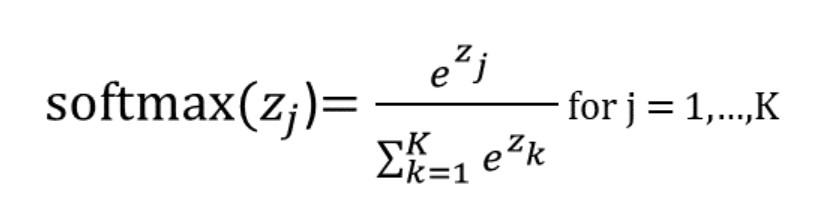

In [55]:
# now let us use the dot product to match between the first input vector and the query
# dot product
match = dot([input_encoded_m, question_encoded], axes = (2,2))
match = Activation('softmax')(match)

In [56]:
# add this match matrix to second input vector sequence
response = add([match, input_encoded_c])
response = Permute((2,1))(response)
# permutes the dimensions i.e 2 and 1

In [57]:
# concatenate
answer = concatenate([response, question_encoded])
answer

<KerasTensor: shape=(None, 6, 220) dtype=float32 (created by layer 'concatenate')>

## LSTM - Long Term Short Memory
### It is special type of RNN having higher capability to store the previous information

In [58]:
# apply RNN
answer = LSTM(32)(answer)

In [59]:
# regularize with dropouts
answer = Dropout(0.5)(answer)
answer = Dense(vocab_len)(answer)   # dense deeply connected neural network layer

In [60]:
answer = Activation('softmax')(answer)

In [61]:
# build final modelm
model = Model([input_sequence, question], answer)
model.compile(optimizer = 'rmsprop', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [62]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 156)]        0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 6)]          0           []                               
                                                                                                  
 sequential (Sequential)        (None, None, 64)     2432        ['input_1[0][0]']                
                                                                                                  
 sequential_2 (Sequential)      (None, 6, 64)        2432        ['input_2[0][0]']                
                                                                                              

In [63]:
# train model
# Epochs are the total number of iterations for training the machine learning model with all the training data in one cycle.
history = model.fit([inputs_train, queries_train], answers_train, batch_size = 32, epochs = 20, validation_data = ([inputs_test, queries_test], answers_test))
# you can take even more than 100 epochs as per your system specifications

Epoch 1/20
313/313 [==============================] - 12s 20ms/step - loss: 0.9184 - accuracy: 0.4980 - val_loss: 0.6964 - val_accuracy: 0.5030
Epoch 2/20
313/313 [==============================] - 5s 16ms/step - loss: 0.7034 - accuracy: 0.5120 - val_loss: 0.6932 - val_accuracy: 0.4970
Epoch 3/20
313/313 [==============================] - 5s 15ms/step - loss: 0.6973 - accuracy: 0.5005 - val_loss: 0.6936 - val_accuracy: 0.4970
Epoch 4/20
313/313 [==============================] - 5s 15ms/step - loss: 0.6945 - accuracy: 0.5078 - val_loss: 0.6932 - val_accuracy: 0.5030
Epoch 5/20
313/313 [==============================] - 5s 15ms/step - loss: 0.6951 - accuracy: 0.4898 - val_loss: 0.6947 - val_accuracy: 0.4970
Epoch 6/20
313/313 [==============================] - 5s 15ms/step - loss: 0.6949 - accuracy: 0.4952 - val_loss: 0.6933 - val_accuracy: 0.5030
Epoch 7/20
313/313 [==============================] - 5s 16ms/step - loss: 0.6944 - accuracy: 0.5020 - val_loss: 0.6940 - val_accuracy: 0.503

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


Text(0, 0.5, 'Epochs')

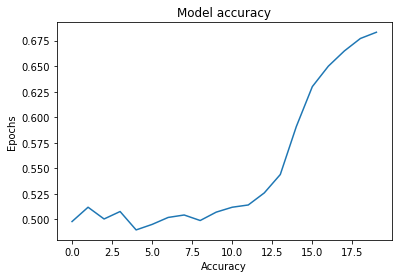

In [64]:
# valuating the model
import matplotlib.pyplot as plt
print(history.history.keys())
plt.plot(history.history['accuracy'])
plt.title("Model accuracy")
plt.xlabel("Accuracy")
plt.ylabel("Epochs")


Text(0, 0.5, 'Epochs')

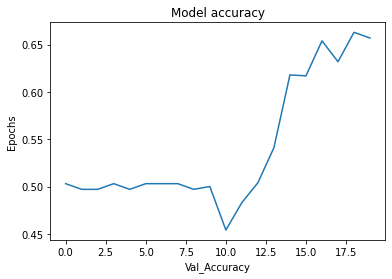

In [65]:
plt.plot(history.history['val_accuracy'])
plt.title("Model accuracy")
plt.xlabel("Val_Accuracy")
plt.ylabel("Epochs")

Text(0, 0.5, 'Epochs')

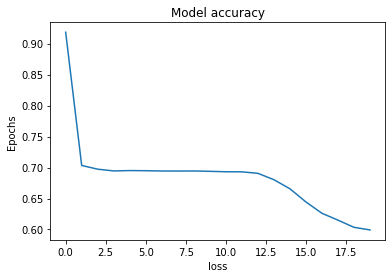

In [66]:
plt.plot(history.history['loss'])
plt.title("Model accuracy")
plt.xlabel("loss")
plt.ylabel("Epochs")

Text(0, 0.5, 'Epochs')

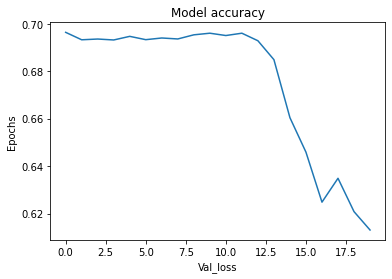

In [67]:
plt.plot(history.history['val_loss'])
plt.title("Model accuracy")
plt.xlabel("Val_loss")
plt.ylabel("Epochs")

Text(0, 0.5, 'Epochs')

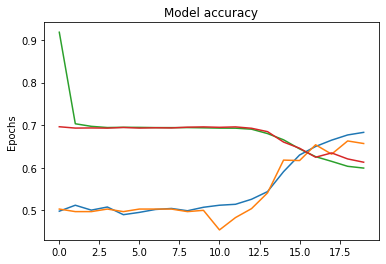

In [68]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title("Model accuracy")
plt.ylabel("Epochs")

In [69]:
# Save Model
model.save('chatbot_model')

INFO:tensorflow:Assets written to: chatbot_model\assets


INFO:tensorflow:Assets written to: chatbot_model\assets


In [70]:
# Evaluation on test set
model.load_weights('chatbot_model')

In [71]:
pred_results = model.predict((inputs_test, queries_test))

32/32 [==============================] - 1s 4ms/step


In [72]:
test_data[0][0]

['Mary',
 'got',
 'the',
 'milk',
 'there',
 '.',
 'John',
 'moved',
 'to',
 'the',
 'bedroom',
 '.']

# 1


In [73]:
story_1 = ' '.join(word for word in test_data[0][0])
story_1

'Mary got the milk there . John moved to the bedroom .'

In [74]:
query_1 = ' '.join(word for word in test_data[0][1])
query_1

'Is John in the kitchen ?'

In [75]:
test_data[0][2]

'no'

# 10


In [76]:
story_10 = ' '.join(word for word in test_data[10][0])
story_10

'John moved to the hallway . Sandra went to the bedroom .'

In [77]:
query_10 = ' '.join(word for word in test_data[10][1])
query_10

'Is John in the hallway ?'

In [78]:
test_data[10][2]

'yes'

# 13

In [79]:
story_13 = ' '.join(word for word in test_data[13][0])
story_13

'John moved to the hallway . Sandra went to the bedroom . Sandra travelled to the garden . John got the football there . Daniel went back to the bedroom . Mary moved to the bathroom . Mary went to the kitchen . Sandra went to the hallway .'

In [80]:
query_13 = ' '.join(word for word in test_data[13][1])
query_13

'Is Mary in the kitchen ?'

In [81]:
test_data[13][2]

'yes'

In [82]:
# generate predictions from model
val_max = np.argmax(pred_results[1])
for key, val in tokenizer.word_index.items():
    if val == val_max:
        k = key
print("Predicted answer : ", k)
print("Probability of certainity :", pred_results[1][val_max])


Predicted answer :  no
Probability of certainity : 0.6965378


In [83]:
# create story by ourselves
vocab

{'.',
 '?',
 'Daniel',
 'Is',
 'John',
 'Mary',
 'Sandra',
 'apple',
 'back',
 'bathroom',
 'bedroom',
 'discarded',
 'down',
 'dropped',
 'football',
 'garden',
 'got',
 'grabbed',
 'hallway',
 'in',
 'journeyed',
 'kitchen',
 'left',
 'milk',
 'moved',
 'no',
 'office',
 'picked',
 'put',
 'the',
 'there',
 'to',
 'took',
 'travelled',
 'up',
 'went',
 'yes'}

### Prediction_1

In [84]:
story = "Mary dropped football . Sandra discarded apple in kitchen . Daniel went to office"
story.split()

['Mary',
 'dropped',
 'football',
 '.',
 'Sandra',
 'discarded',
 'apple',
 'in',
 'kitchen',
 '.',
 'Daniel',
 'went',
 'to',
 'office']

In [85]:
my_question = "Is Sandra in the kitchen ? "
my_question.split()

['Is', 'Sandra', 'in', 'the', 'kitchen', '?']

In [86]:
mydata = [(story.split(), my_question.split(), 'yes')]


In [87]:
my_story, my_question, my_answer = vectorize_stories(mydata)


In [88]:
pred_results = model.predict(([my_story, my_question]))

1/1 [==============================] - 0s 28ms/step


In [89]:
# generate predictions from model
val_max = np.argmax(pred_results[0])
for key, val in tokenizer.word_index.items():
    if val == val_max:
        k = key
        
print("Predicted answer : ", k)
print("Probability of certainity : ", pred_results[0][val_max])

Predicted answer :  yes
Probability of certainity :  0.59319735


### Prediction_2


In [90]:
story = "John dropped football . Mary went to office "
story.split()

['John', 'dropped', 'football', '.', 'Mary', 'went', 'to', 'office']

In [91]:
my_question = "Is Mary in the office ? "
my_question.split()

['Is', 'Mary', 'in', 'the', 'office', '?']

In [92]:
mydata = [(story.split(), my_question.split(), 'yes')]


In [93]:
my_story, my_question, my_answer = vectorize_stories(mydata)


In [94]:
pred_results = model.predict(([my_story, my_question]))

1/1 [==============================] - 0s 33ms/step


In [95]:
# generate predictions from model
val_max = np.argmax(pred_results[0])
for key, val in tokenizer.word_index.items():
    if val == val_max:
        k = key
print("Predicted answer : ", k)
print("Probability of certainity :", pred_results[0][val_max])


Predicted answer :  yes
Probability of certainity : 0.548982
